In [1]:
import pandas as pd
import numpy as np
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
print("Setup Complete")

Setup Complete


In [8]:
spotify = pd.read_csv('./data/spotify_data/Spotify_Dataset_V3.csv', sep=';', parse_dates=['Date'], dayfirst=True)
spotify.head()

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Valence,# of Artist,Artist (Ind.),# of Nationality,Nationality,Continent,Points (Total),Points (Ind for each Artist/Nat),id,Song URL
0,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",2023-05-29,0.668,0.758,-5176.0,0.033,0.483,0.000,0.834,Artist 1,Eslabon Armado,Nationality 1,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...
1,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",2023-05-29,0.668,0.758,-5176.0,0.033,0.483,0.000,0.834,Artist 2,Peso Pluma,Nationality 2,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...
2,2,WHERE SHE GOES,Bad Bunny,2023-05-29,0.652,0.800,-4019.0,0.061,0.143,0.629,0.234,Artist 1,Bad Bunny,Nationality 1,Puerto Rico,Latin-America,199,199.0,7ro0hRteUMfnOioTFI5TG1,https://open.spotify.com/track/7ro0hRteUMfnOio...
3,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",2023-05-29,0.812,0.479,-5678.0,0.333,0.213,0.000,0.559,Artist 1,Yng Lvcas,Nationality 1,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...
4,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",2023-05-29,0.812,0.479,-5678.0,0.333,0.213,0.000,0.559,Artist 2,Peso Pluma,Nationality 2,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...


In [34]:
#remove the songs have the same id but different title

df1 = spotify[['Title', 'id']].drop_duplicates()
df2 = spotify[['Title', 'id']].drop_duplicates(subset=['id'])
Title1 = df1['Title'].values
Title2 = df2['Title'].values
dirty_data = np.setdiff1d(Title1, Title2, assume_unique=False)
# print(len(dirty_data))
# print(dirty_data)

for title in dirty_data:
    index = spotify[spotify['Title']==title].iloc[0]['id']
    spotify.loc[spotify['id']==index, 'Title'] = title

#unique songs and dates(keep other columns)
spotify_new = spotify.drop_duplicates(subset=['id', 'Date'])

spotify_new[spotify_new['Date']=="2017-01-01"] # top 200 ranking per day

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Valence,# of Artist,Artist (Ind.),# of Nationality,Nationality,Continent,Points (Total),Points (Ind for each Artist/Nat),id,Song URL
651678,1,Starboy,"The Weeknd, Daft Punk",2017-01-01,0.681,0.594,-7028.0,0.282,0.165,0.000,0.535,Artist 1,The Weeknd,Nationality 1,Canada,Anglo-America,200,100.0,5aAx2yezTd8zXrkmtKl66Z,https://open.spotify.com/track/5aAx2yezTd8zXrk...
651680,2,Closer,"The Chainsmokers, Halsey",2017-01-01,0.748,0.524,-5599.0,0.034,0.414,0.000,0.661,Artist 1,The Chainsmokers,Nationality 1,United States,Anglo-America,199,100.0,7BKLCZ1jbUBVqRi2FVlTVw,https://open.spotify.com/track/7BKLCZ1jbUBVqRi...
651682,3,Let Me Love You,"DJ Snake, Justin Bieber",2017-01-01,0.476,0.718,-5309.0,0.058,0.078,0.000,0.142,Artist 1,DJ Snake,Nationality 1,Germany,Europe,198,99.0,4pdPtRcBmOSQDlJ3Fk945m,https://open.spotify.com/track/4pdPtRcBmOSQDlJ...
651684,4,Rockabye (feat. Sean Paul & Anne-Marie),Clean Bandit,2017-01-01,0.720,0.763,-4068.0,0.052,0.406,0.000,0.742,Artist 1,Clean Bandit,Nationality 1,United Kingdom,Europe,197,197.0,5knuzwU65gJK7IF5yJsuaW,https://open.spotify.com/track/5knuzwU65gJK7IF...
651685,5,One Dance,"Drake, WizKid, Kyla",2017-01-01,0.791,0.619,-5886.0,0.053,0.008,0.004,0.371,Artist 1,Drake,Nationality 1,Canada,Anglo-America,196,65.0,1xznGGDReH1oQq0xzbwXa3,https://open.spotify.com/track/1xznGGDReH1oQq0...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
651930,196,White Iverson,Post Malone,2017-01-01,0.675,0.562,-7678.0,0.035,0.233,0.000,0.309,Artist 1,Post Malone,Nationality 1,United States,Anglo-America,5,5.0,6eT7xZZlB2mwyzJ2sUKG6w,https://open.spotify.com/track/6eT7xZZlB2mwyzJ...
651931,197,Oh Lord,MiC LOWRY,2017-01-01,0.273,0.794,-6644.0,0.068,0.022,0.000,0.377,Artist 1,MiC LOWRY,Nationality 1,United Kingdom,Europe,4,4.0,1sTUEdVO85YU8Ymk2jeAls,https://open.spotify.com/track/1sTUEdVO85YU8Ym...
651932,198,Superstition - Single Version,Stevie Wonder,2017-01-01,0.650,0.658,-10908.0,0.085,0.089,0.004,0.883,Artist 1,Stevie Wonder,Nationality 1,United States,Anglo-America,3,3.0,5lXcSvHRVjQJ3LB2rLKQog,https://open.spotify.com/track/5lXcSvHRVjQJ3LB...
651933,199,Secrets,The Weeknd,2017-01-01,0.665,0.771,-5779.0,0.053,0.016,0.000,0.764,Artist 1,The Weeknd,Nationality 1,Canada,Anglo-America,2,2.0,3DX4Y0egvc0slLcLl31h2p,https://open.spotify.com/track/3DX4Y0egvc0slLc...


In [10]:
spotify[spotify['id']=='6E90gq0KO6FYZVOXx8kCcC'][['Title', 'id','Nationality']].drop_duplicates()

,Title,id,Nationality
129401,Astronaut In The Ocean,6E90gq0KO6FYZVOXx8kCcC,Australia


In [81]:
data_dict = {}

for col in ['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Valence']:
    daily_list = []
    for date in spotify['Date'].sort_values().unique():
        spotify_date = spotify[spotify_new["Date"]==date]
        daily_feature = (spotify_date[col] * spotify_date['Points (Total)'] / 200).sum()
        daily_list.append(daily_feature)
    data_dict[col] = daily_list

df_features_daily = pd.DataFrame(data=data_dict, index=spotify['Date'].sort_values().unique())
df_features_daily.head()

,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Valence
2017-01-01,68.821860,67.519500,-525889.590785,12.625105,18.011635,0.749075,52.060575
2017-01-02,68.174175,66.868390,-529129.367650,12.459180,18.766535,0.736315,50.349065
2017-01-03,68.175065,66.693635,-530760.764800,12.547145,18.807475,0.768240,50.171780
2017-01-04,68.112745,66.706365,-530201.240650,12.556325,18.775380,0.795810,50.075690
2017-01-05,68.148370,66.715960,-528734.162000,12.545505,18.876955,0.806015,50.033470


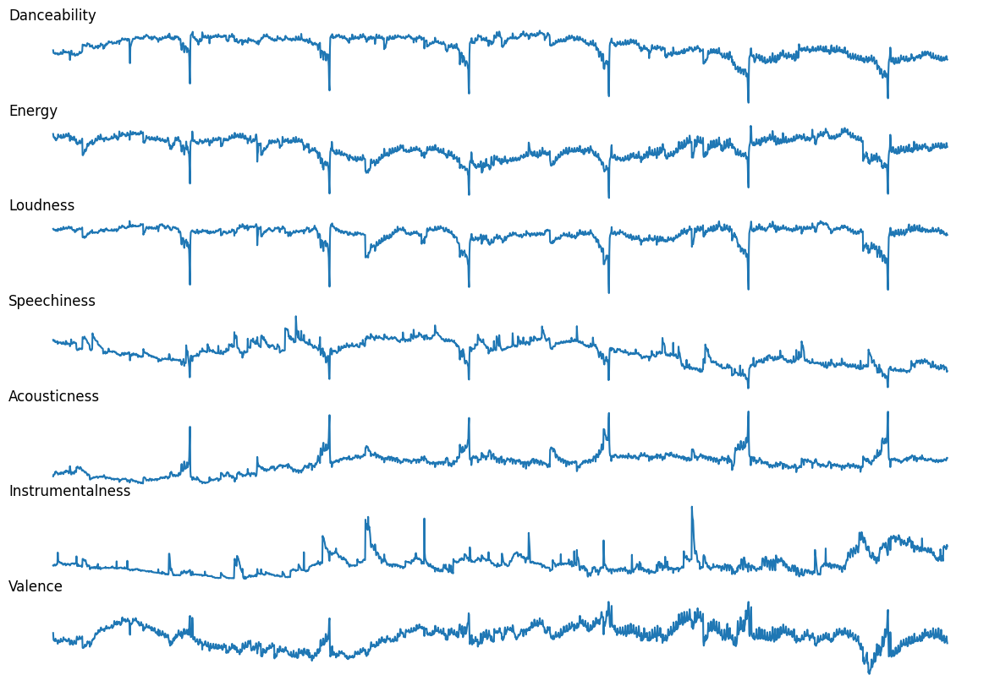

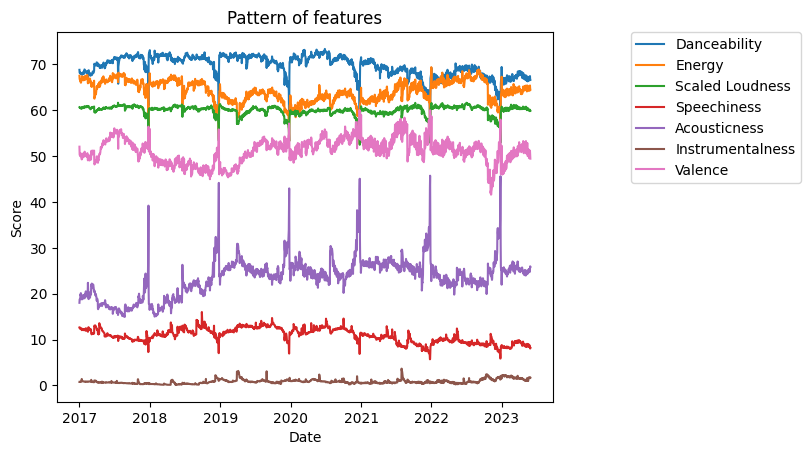

In [97]:
#use minmaxscaler to normalize the data

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
# scaler = MinMaxScaler()
scaler = StandardScaler()
df_features_daily_std = df_features_daily.copy()
df_features_daily_std[['Loudness']] = scaler.fit_transform(df_features_daily[["Loudness"]]) + 60

#plot the pattern of features in vertical subplots
plt.figure(figsize=(15, 10))
for i in range(7):
    plt.subplot(7, 1, i+1)
    plt.plot(df_features_daily.index, df_features_daily.iloc[:, i])
    plt.title(df_features_daily.columns[i], loc='left')
    plt.axis('off')
plt.show()

for col in df_features_daily_std.columns:
    if col == 'Loudness':
        plt.plot(df_features_daily_std.index, df_features_daily_std[col], label='Scaled Loudness')
        continue
    plt.plot(df_features_daily_std.index, df_features_daily_std[col], label=col)
plt.legend(loc='upper right', bbox_to_anchor=(1.5,1.0),borderaxespad = 0.)
plt.xlabel('Date')
plt.ylabel('Score')
plt.title('Pattern of features')
plt.show()

# SerialDependence

In [164]:
# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 4))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
)
%config InlineBackend.figure_format = 'retina'

def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    from matplotlib.offsetbox import AnchoredText
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line_kws,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr:.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax

def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):
    import math
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags / nrows))
    kwargs.setdefault('figsize', (kwargs['ncols'] * 2, nrows * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k + 1 <= lags:
            ax = lagplot(x, y, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel=y.name if y is not None else x.name)
    fig.suptitle(f"Lag plots for {x.name}", fontsize=16)
    fig.tight_layout()
    return fig

/var/folders/lw/cbxh4d5n6nj91c7dnbv6yy740000gn/T/ipykernel_69492/2895732901.py:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


## Danceability

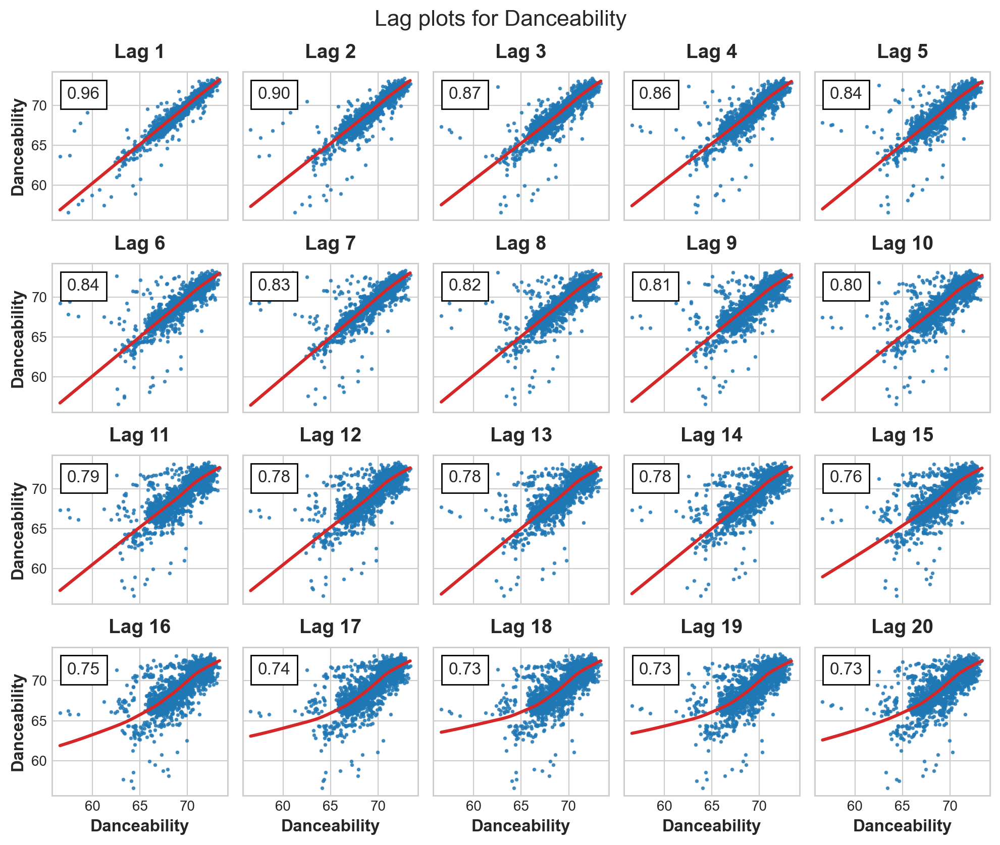

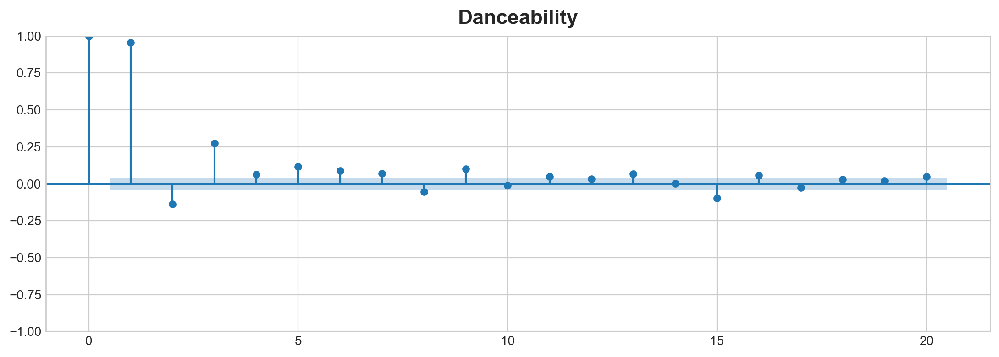

In [167]:
df_danceability = df_features_daily_std["Danceability"]
_ = plot_lags(df_danceability, lags=20, nrows=4)
from statsmodels.graphics.tsaplots import plot_pacf
_ = plot_pacf(df_danceability, lags=20,title="Danceability")

In [117]:
def lag_LinReg(df, lags, train_size=0.5):
    X = make_lags(df, lags=lags)
    X = X.fillna(0.0)
    y = df.copy()
    X_train, X_test, y_train, y_test = train_test_split(X[9:], y[9:], shuffle=False, train_size=train_size)
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = pd.Series(model.predict(X_train), index=y_train.index)
    y_fore = pd.Series(model.predict(X_test), index=y_test.index)
    return y_train, y_test, y_pred, y_fore

### Linear Regression (Danceability)

In [109]:
X = make_lags(df_danceability, lags=9)
X = X.fillna(0.0)

X.head(10)

,y_lag_1,y_lag_2,y_lag_3,y_lag_4,y_lag_5,y_lag_6,y_lag_7,y_lag_8,y_lag_9
2017-01-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
2017-01-02,68.821860,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
2017-01-03,68.174175,68.821860,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
2017-01-04,68.175065,68.174175,68.821860,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
2017-01-05,68.112745,68.175065,68.174175,68.821860,0.000000,0.000000,0.000000,0.000000,0.00000
2017-01-06,68.148370,68.112745,68.175065,68.174175,68.821860,0.000000,0.000000,0.000000,0.00000
2017-01-07,67.958925,68.148370,68.112745,68.175065,68.174175,68.821860,0.000000,0.000000,0.00000
2017-01-08,68.210445,67.958925,68.148370,68.112745,68.175065,68.174175,68.821860,0.000000,0.00000
2017-01-09,68.049070,68.210445,67.958925,68.148370,68.112745,68.175065,68.174175,68.821860,0.00000
2017-01-10,68.038840,68.049070,68.210445,67.958925,68.148370,68.112745,68.175065,68.174175,68.82186


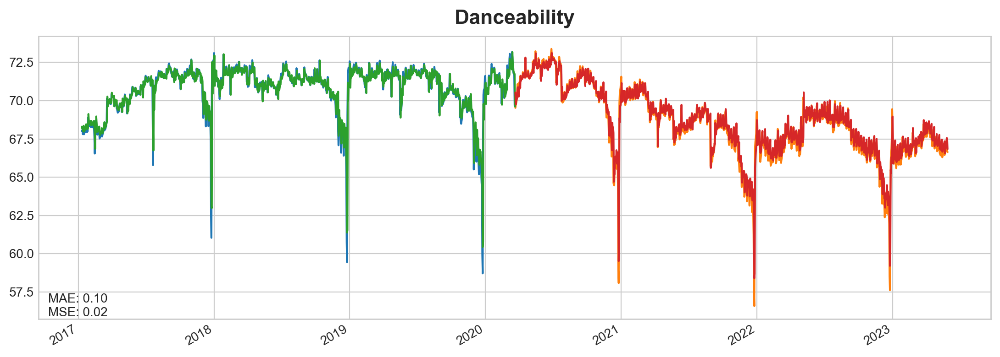

In [184]:
y_train, y_test, y_pred, y_fore = lag_LinReg(df_danceability, lags=9, train_size=0.5)

ax = y_train.plot()
ax = y_test.plot()
ax = y_pred.plot(ax=ax)
_ = y_fore.plot(ax=ax, color='C3')
ax.annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.01, 0.01), xycoords='axes fraction')
ax.title.set_text("Danceability")

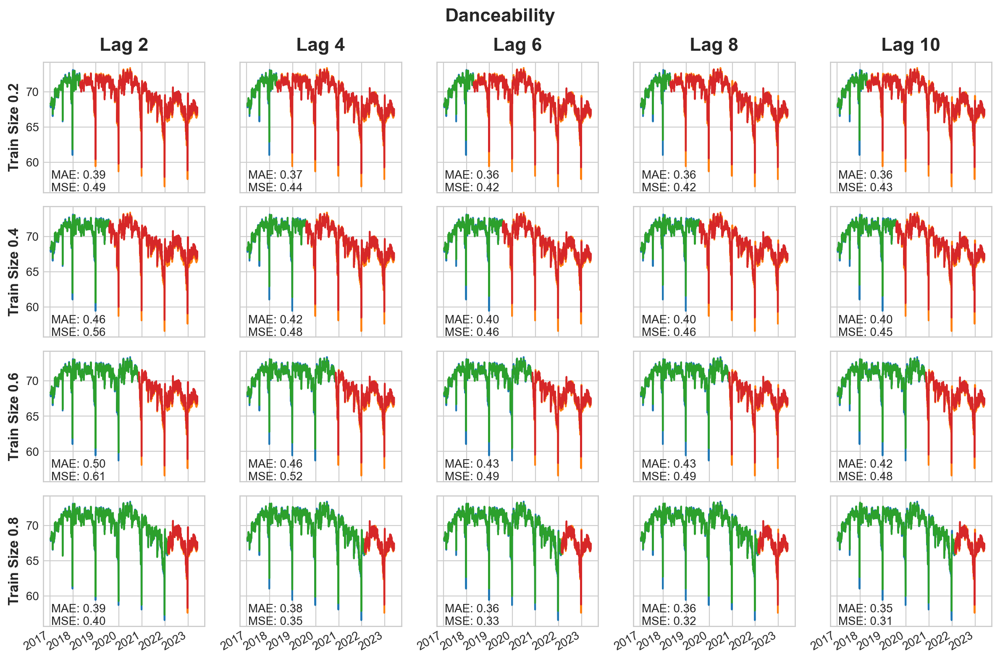

In [146]:
#lags从2到10，步长为2，train_size从0.2，0.4，0.6，0.8，做出不同的图
#并配上每种情况的elvation
from sklearn.metrics import mean_absolute_error, mean_squared_error

lags = range(2, 11, 2)
train_sizes = [0.2, 0.4, 0.6, 0.8]
fig, axs = plt.subplots(nrows=len(train_sizes), ncols=len(lags), figsize=(12, 8), sharex=True, sharey=True)
for i, train_size in enumerate(train_sizes):
    for j, lag in enumerate(lags):
        y_train, y_test, y_pred, y_fore = lag_LinReg(df_danceability, lags=lag, train_size=train_size)
        MAE = mean_absolute_error(y_test, y_fore)
        MSE = mean_squared_error(y_test, y_fore)
        ax = y_train.plot(ax=axs[i, j], legend=False)
        ax = y_test.plot(ax=axs[i, j], legend=False)
        ax = y_pred.plot(ax=axs[i, j], legend=False)
        _ = y_fore.plot(ax=axs[i, j], legend=False, color='C3')
        axs[i, j].annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.05, 0.01), xycoords='axes fraction')
        if i == 0:
            axs[i, j].set_title(f"Lag {lag}")
        if j == 0:
            axs[i, j].set_ylabel(f"Train Size {train_size}")
fig.suptitle("Danceability", fontsize=16, fontweight='bold')     
fig.tight_layout()

### Linear Regression (Energy)

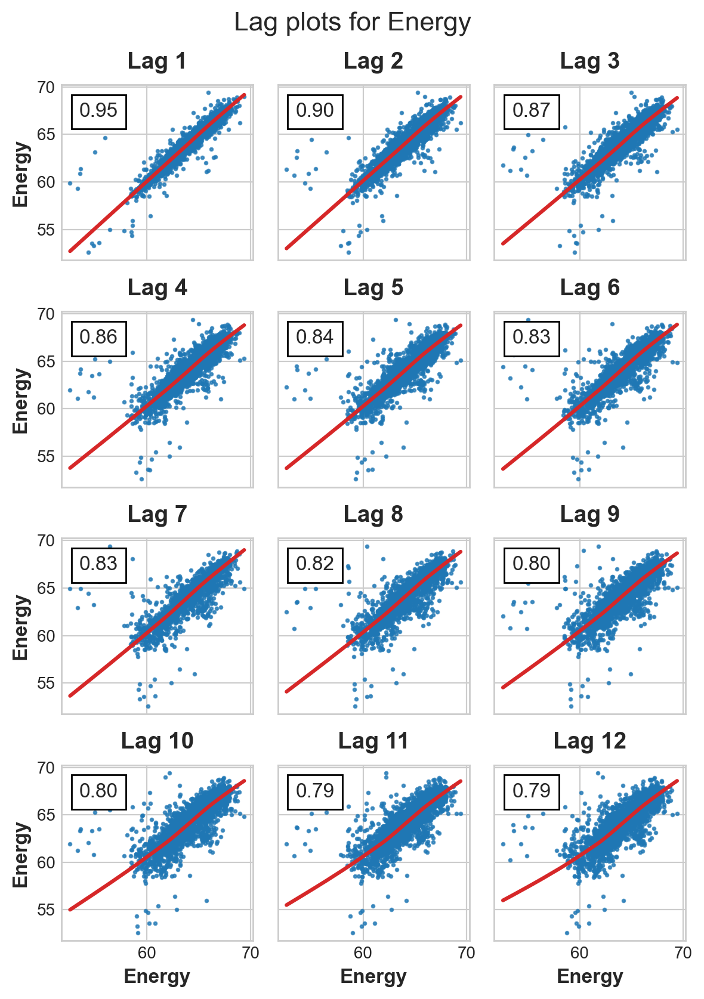

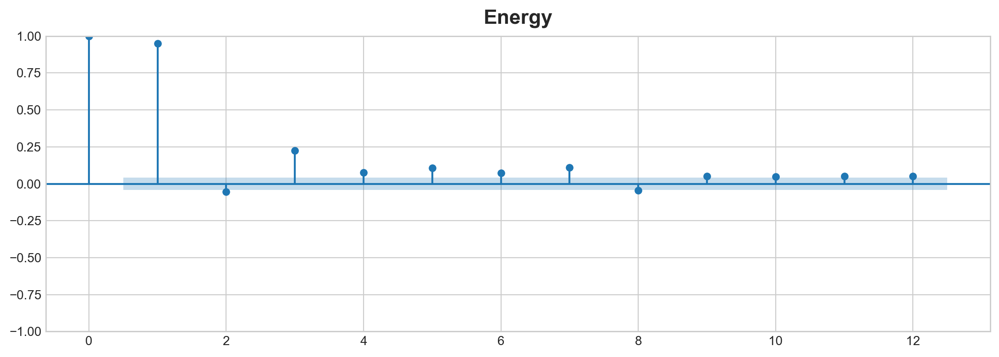

In [191]:
df_energy = df_features_daily_std["Energy"]
_ = plot_lags(df_energy, lags=12, nrows=4)
from statsmodels.graphics.tsaplots import plot_pacf
_ = plot_pacf(df_energy, lags=12, title="Energy")

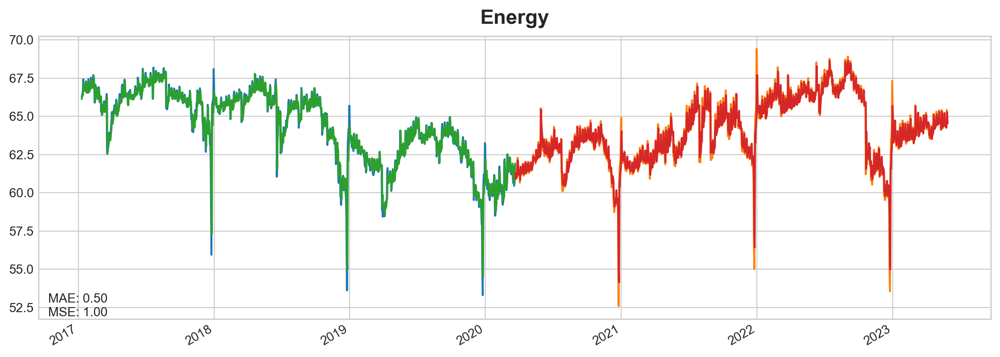

In [192]:
y_train, y_test, y_pred, y_fore = lag_LinReg(df_energy, lags=7, train_size=0.5)

ax = y_train.plot()
ax = y_test.plot()
ax = y_pred.plot(ax=ax)
_ = y_fore.plot(ax=ax, color='C3')
ax.annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.01, 0.01), xycoords='axes fraction')
ax.title.set_text("Energy")

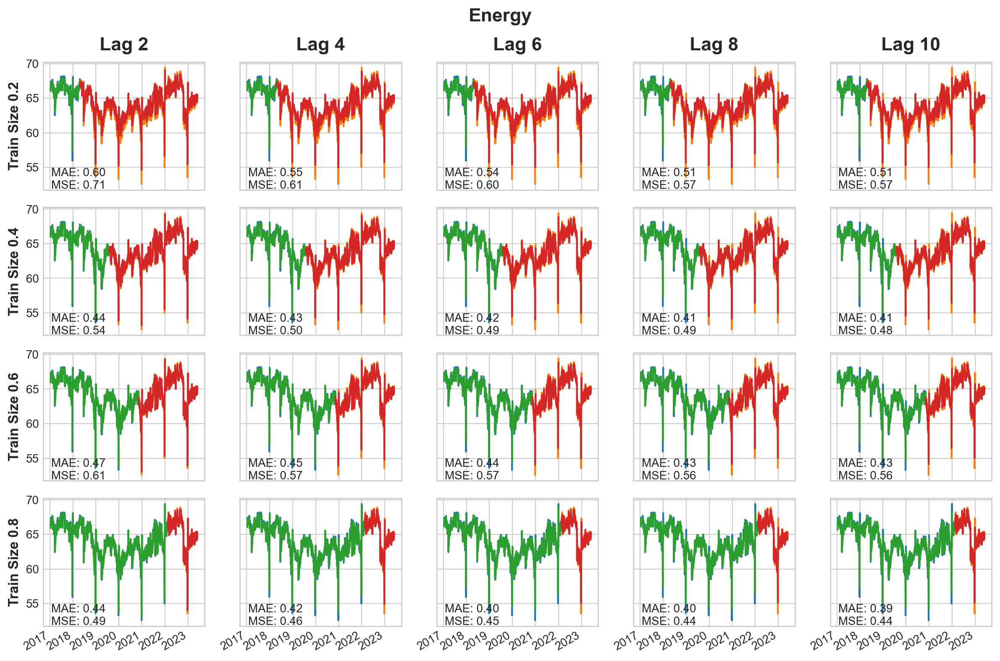

In [193]:
lags = range(2, 11, 2)
train_sizes = [0.2, 0.4, 0.6, 0.8]
fig, axs = plt.subplots(nrows=len(train_sizes), ncols=len(lags), figsize=(12, 8), sharex=True, sharey=True)
for i, train_size in enumerate(train_sizes):
    for j, lag in enumerate(lags):
        y_train, y_test, y_pred, y_fore = lag_LinReg(df_energy, lags=lag, train_size=train_size)
        MAE = mean_absolute_error(y_test, y_fore)
        MSE = mean_squared_error(y_test, y_fore)
        ax = y_train.plot(ax=axs[i, j], legend=False)
        ax = y_test.plot(ax=axs[i, j], legend=False)
        ax = y_pred.plot(ax=axs[i, j], legend=False)
        _ = y_fore.plot(ax=axs[i, j], legend=False, color='C3')
        axs[i, j].annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.05, 0.01), xycoords='axes fraction')
        if i == 0:
            axs[i, j].set_title(f"Lag {lag}")
        if j == 0:
            axs[i, j].set_ylabel(f"Train Size {train_size}")
fig.suptitle("Energy", fontsize=16, fontweight='bold')
fig.tight_layout()

### Linear Regression (Loudness)

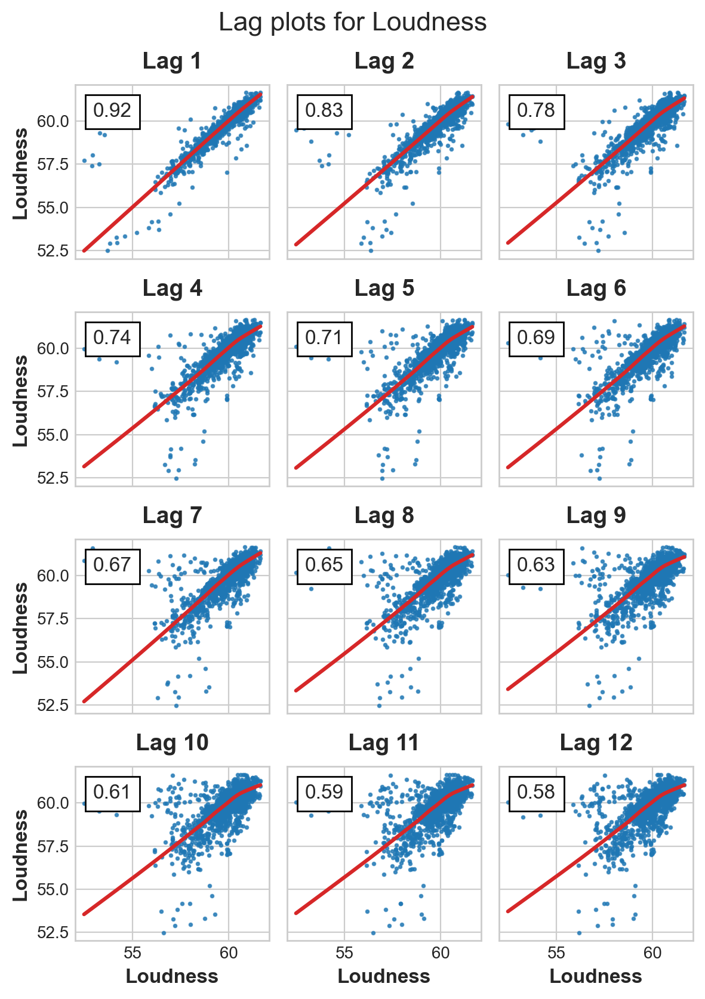

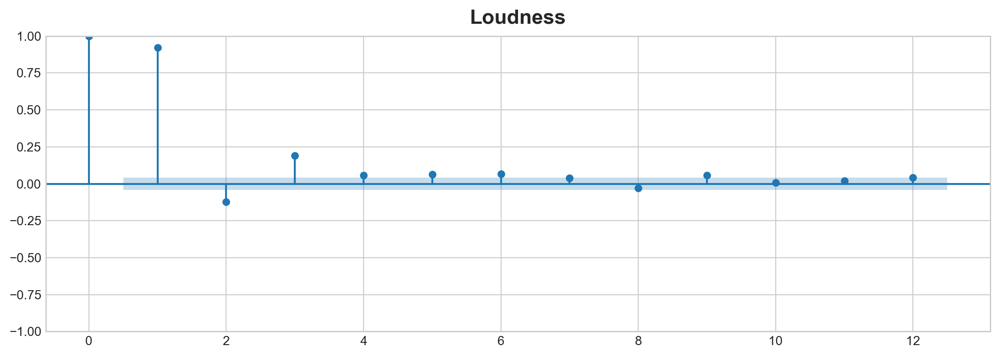

In [173]:
df_loudness = df_features_daily_std["Loudness"]
_ = plot_lags(df_loudness, lags=12, nrows=4)
from statsmodels.graphics.tsaplots import plot_pacf
_ = plot_pacf(df_loudness, lags=12, title="Loudness")

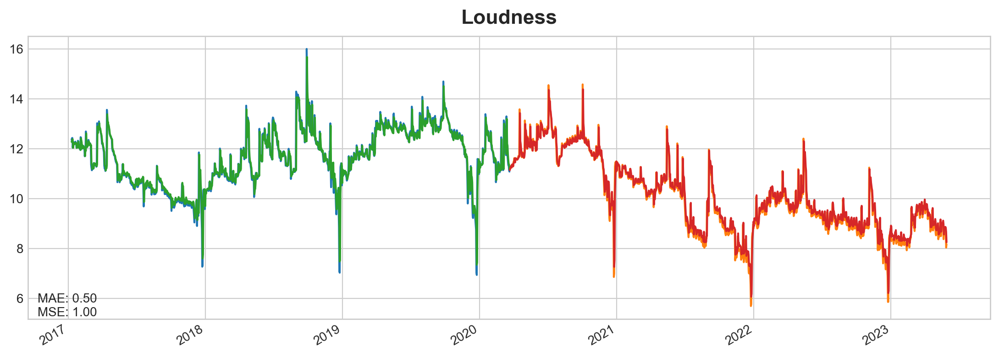

In [170]:
y_train, y_test, y_pred, y_fore = lag_LinReg(df_loudness, lags=3, train_size=0.5)

ax = y_train.plot()
ax = y_test.plot()
ax = y_pred.plot(ax=ax)
_ = y_fore.plot(ax=ax, color='C3')
ax.annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.01, 0.01), xycoords='axes fraction')
ax.title.set_text("Loudness")

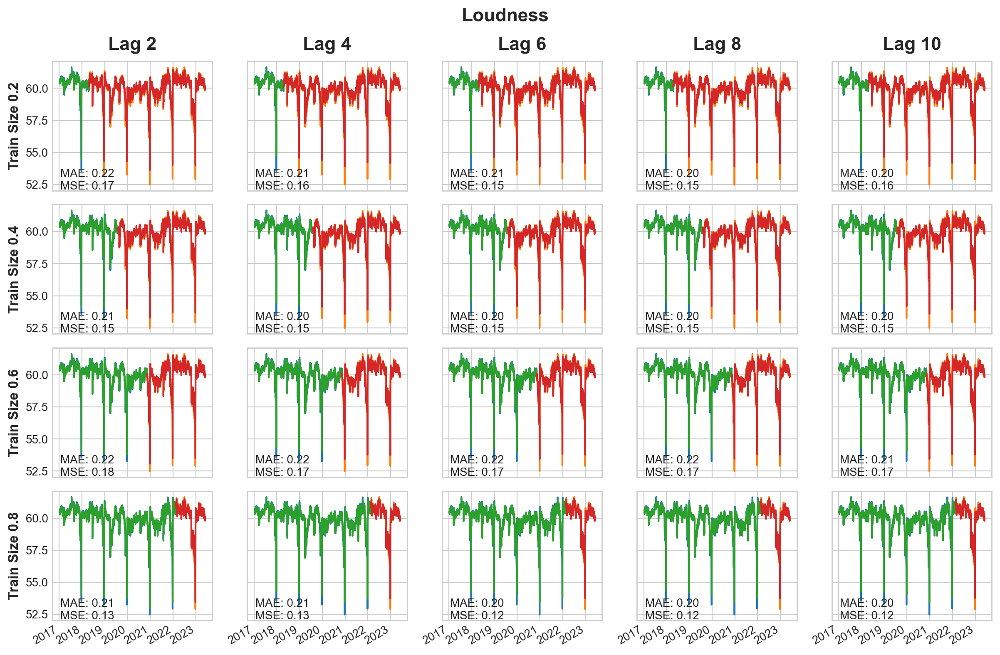

In [149]:
lags = range(2, 11, 2)
train_sizes = [0.2, 0.4, 0.6, 0.8]
fig, axs = plt.subplots(nrows=len(train_sizes), ncols=len(lags), figsize=(12, 8), sharex=True, sharey=True)
for i, train_size in enumerate(train_sizes):
    for j, lag in enumerate(lags):
        y_train, y_test, y_pred, y_fore = lag_LinReg(df_loudness, lags=lag, train_size=train_size)
        MAE = mean_absolute_error(y_test, y_fore)
        MSE = mean_squared_error(y_test, y_fore)
        ax = y_train.plot(ax=axs[i, j], legend=False)
        ax = y_test.plot(ax=axs[i, j], legend=False)
        ax = y_pred.plot(ax=axs[i, j], legend=False)
        _ = y_fore.plot(ax=axs[i, j], legend=False, color='C3')
        axs[i, j].annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.05, 0.01), xycoords='axes fraction')
        if i == 0:
            axs[i, j].set_title(f"Lag {lag}")
        if j == 0:
            axs[i, j].set_ylabel(f"Train Size {train_size}")
fig.suptitle("Loudness", fontsize=16, fontweight='bold')
fig.tight_layout()

### Linear Regression (Speechiness)

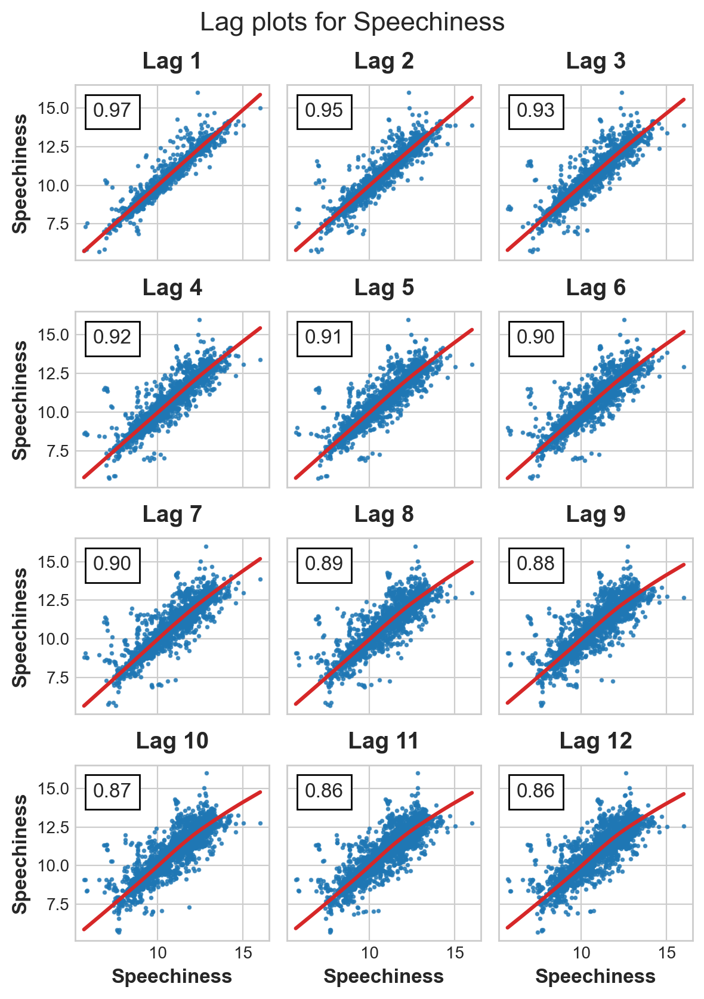

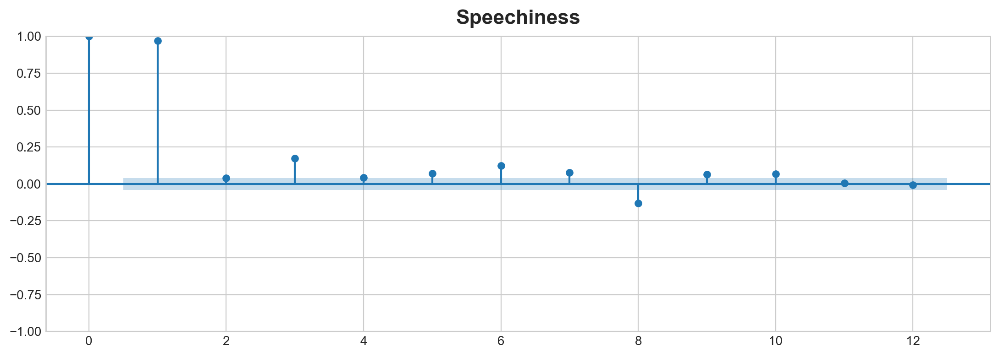

In [174]:
df_speechiness = df_features_daily_std["Speechiness"]
_ = plot_lags(df_speechiness, lags=12, nrows=4)
from statsmodels.graphics.tsaplots import plot_pacf
_ = plot_pacf(df_speechiness, lags=12, title="Speechiness")

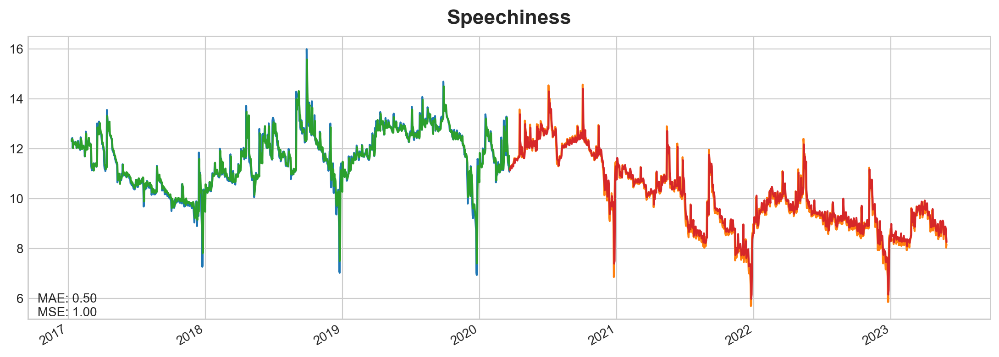

In [172]:
y_train, y_test, y_pred, y_fore = lag_LinReg(df_speechiness, lags=8, train_size=0.5)

ax = y_train.plot()
ax = y_test.plot()
ax = y_pred.plot(ax=ax)
_ = y_fore.plot(ax=ax, color='C3')
ax.annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.01, 0.01), xycoords='axes fraction')
ax.title.set_text("Speechiness")

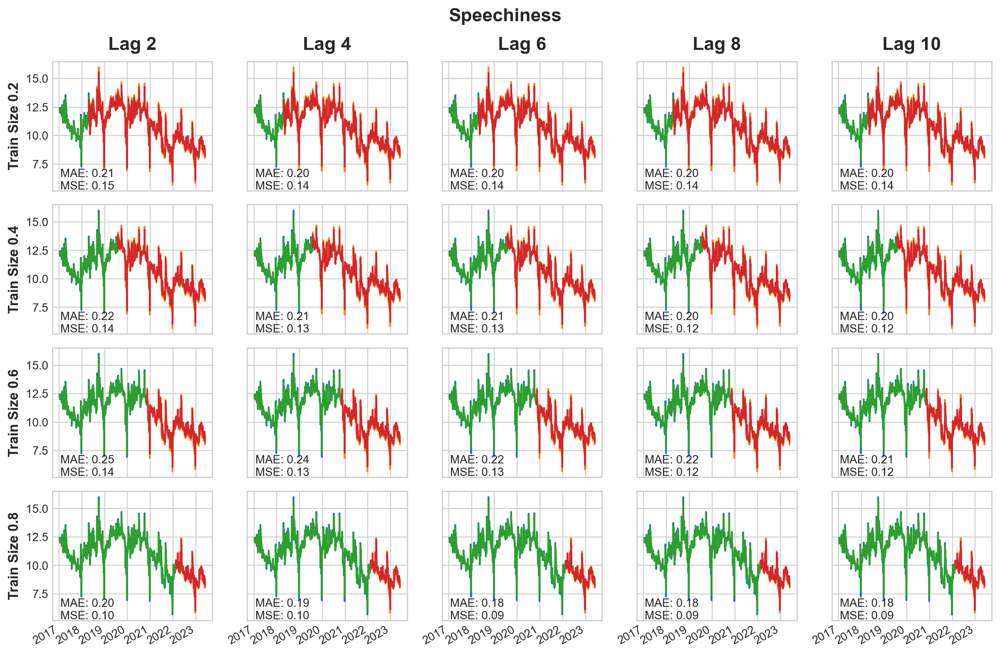

In [154]:
lags = range(2, 11, 2)
train_sizes = [0.2, 0.4, 0.6, 0.8]
fig, axs = plt.subplots(nrows=len(train_sizes), ncols=len(lags), figsize=(12, 8), sharex=True, sharey=True)
for i, train_size in enumerate(train_sizes):
    for j, lag in enumerate(lags):
        y_train, y_test, y_pred, y_fore = lag_LinReg(df_speechiness, lags=lag, train_size=train_size)
        MAE = mean_absolute_error(y_test, y_fore)
        MSE = mean_squared_error(y_test, y_fore)
        ax = y_train.plot(ax=axs[i, j], legend=False)
        ax = y_test.plot(ax=axs[i, j], legend=False)
        ax = y_pred.plot(ax=axs[i, j], legend=False)
        _ = y_fore.plot(ax=axs[i, j], legend=False, color='C3')
        axs[i, j].annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.05, 0.01), xycoords='axes fraction')
        if i == 0:
            axs[i, j].set_title(f"Lag {lag}")
        if j == 0:
            axs[i, j].set_ylabel(f"Train Size {train_size}")
fig.suptitle("Speechiness", fontsize=16, fontweight='bold')
fig.tight_layout()

### Linear Regression (Acousticness)

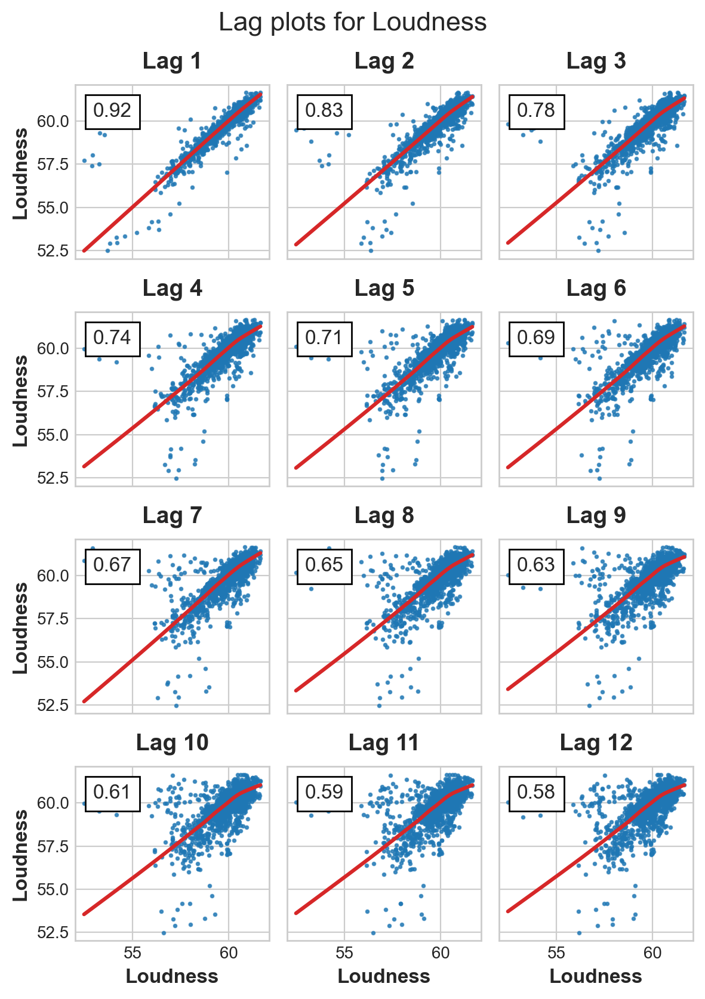

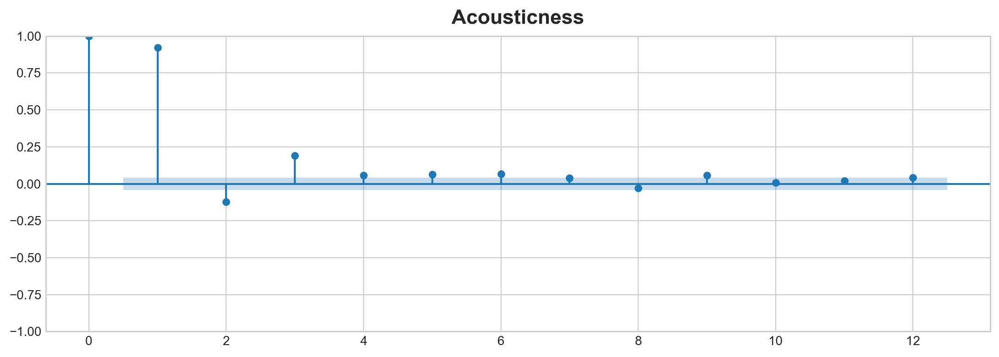

In [175]:
df_acousticness = df_features_daily_std["Acousticness"]
_ = plot_lags(df_loudness, lags=12, nrows=4)
from statsmodels.graphics.tsaplots import plot_pacf
_ = plot_pacf(df_loudness, lags=12, title="Acousticness")

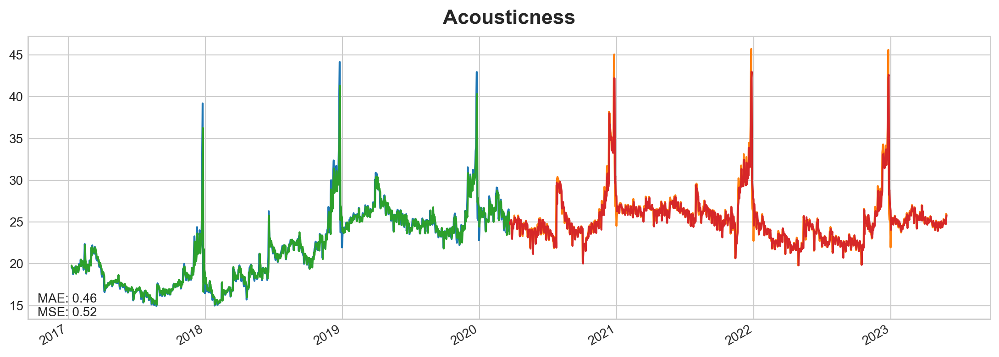

In [188]:
y_train, y_test, y_pred, y_fore = lag_LinReg(df_acousticness, lags=9, train_size=0.5)

ax = y_train.plot()
ax = y_test.plot()
ax = y_pred.plot(ax=ax)
_ = y_fore.plot(ax=ax, color='C3')
ax.annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.01, 0.01), xycoords='axes fraction')
ax.title.set_text("Acousticness")

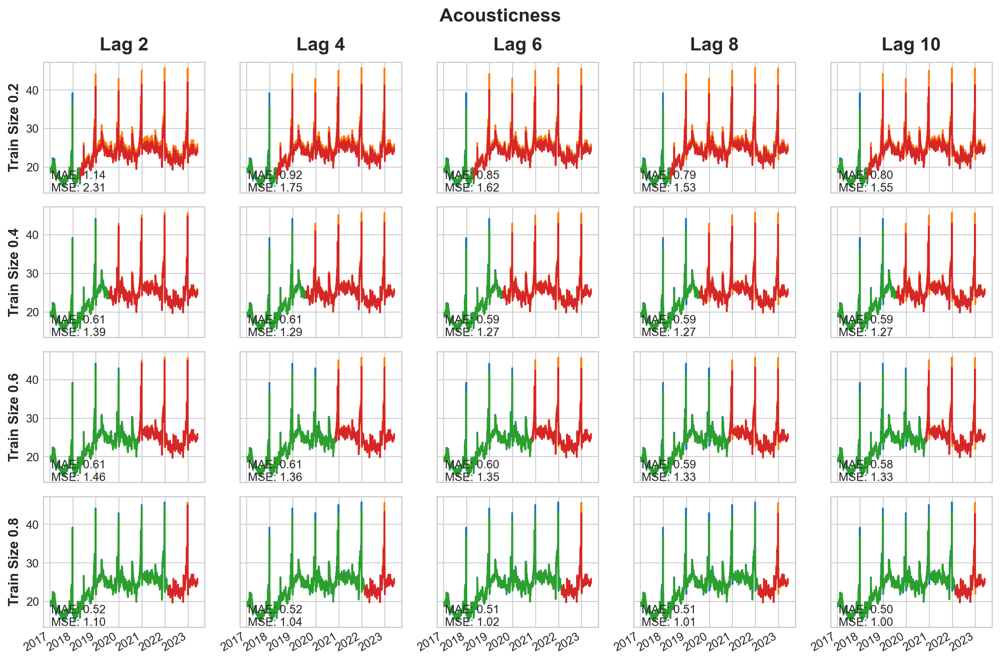

In [189]:
lags = range(2, 11, 2)
train_sizes = [0.2, 0.4, 0.6, 0.8]
fig, axs = plt.subplots(nrows=len(train_sizes), ncols=len(lags), figsize=(12, 8), sharex=True, sharey=True)
for i, train_size in enumerate(train_sizes):
    for j, lag in enumerate(lags):
        y_train, y_test, y_pred, y_fore = lag_LinReg(df_acousticness, lags=lag, train_size=train_size)
        MAE = mean_absolute_error(y_test, y_fore)
        MSE = mean_squared_error(y_test, y_fore)
        ax = y_train.plot(ax=axs[i, j], legend=False)
        ax = y_test.plot(ax=axs[i, j], legend=False)
        ax = y_pred.plot(ax=axs[i, j], legend=False)
        _ = y_fore.plot(ax=axs[i, j], legend=False, color='C3')
        axs[i, j].annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.05, 0.01), xycoords='axes fraction')
        if i == 0:
            axs[i, j].set_title(f"Lag {lag}")
        if j == 0:
            axs[i, j].set_ylabel(f"Train Size {train_size}")
fig.suptitle("Acousticness", fontsize=16, fontweight='bold')
fig.tight_layout()

### Linear Regression (Instrumentalness)

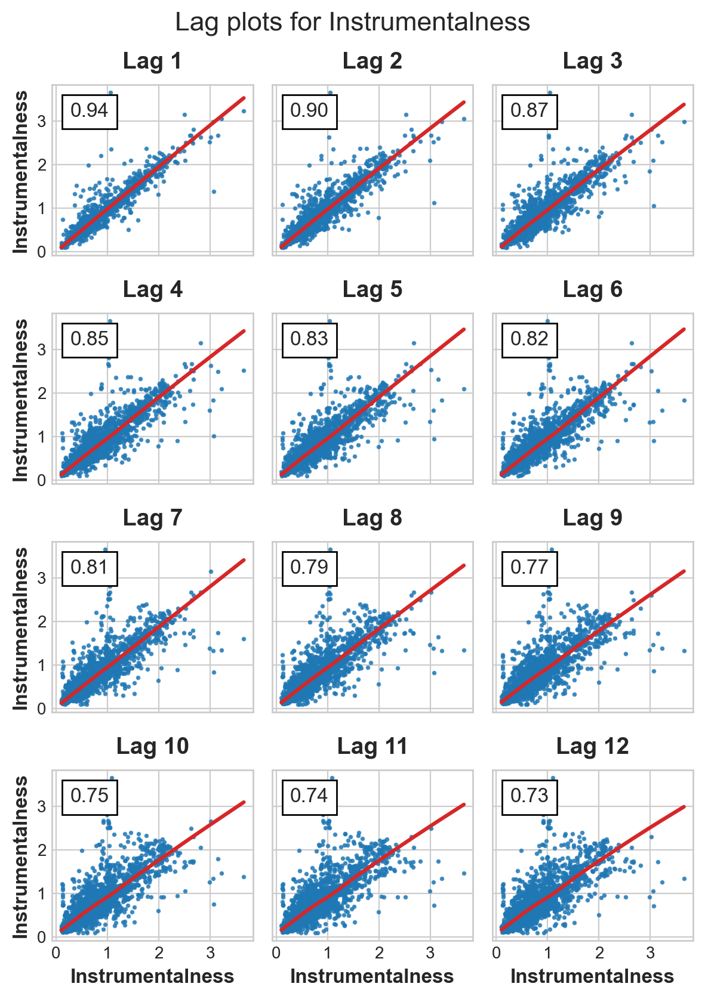

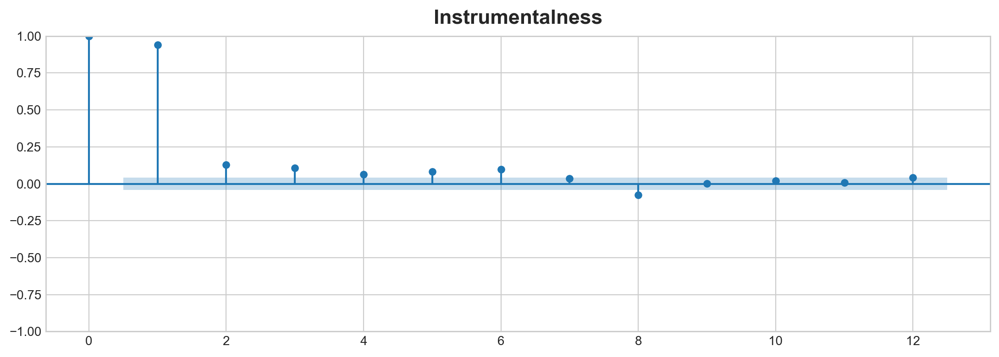

In [177]:
df_instrumentalness = df_features_daily_std["Instrumentalness"]
_ = plot_lags(df_instrumentalness, lags=12, nrows=4)
from statsmodels.graphics.tsaplots import plot_pacf
_ = plot_pacf(df_instrumentalness, lags=12, title="Instrumentalness")

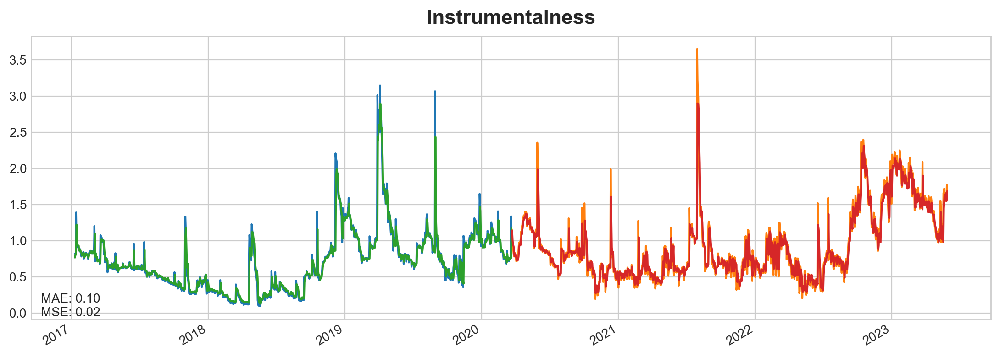

In [180]:
y_train, y_test, y_pred, y_fore = lag_LinReg(df_instrumentalness, lags=8, train_size=0.5)

ax = y_train.plot()
ax = y_test.plot()
ax = y_pred.plot(ax=ax)
_ = y_fore.plot(ax=ax, color='C3')
ax.annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.01, 0.01), xycoords='axes fraction')
ax.title.set_text("Instrumentalness")

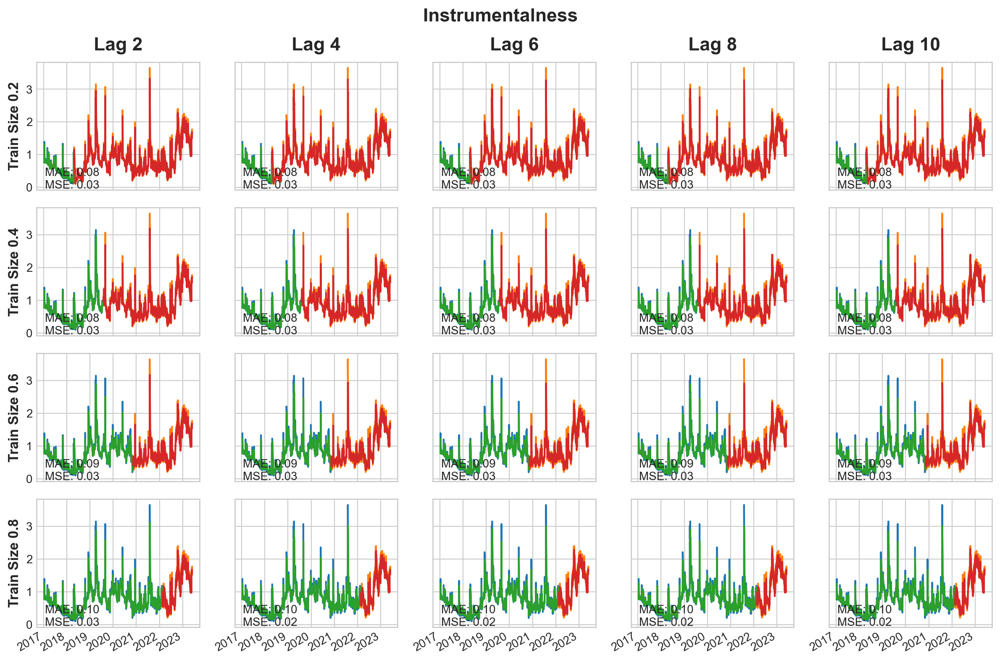

In [179]:
lags = range(2, 11, 2)
train_sizes = [0.2, 0.4, 0.6, 0.8]
fig, axs = plt.subplots(nrows=len(train_sizes), ncols=len(lags), figsize=(12, 8), sharex=True, sharey=True)
for i, train_size in enumerate(train_sizes):
    for j, lag in enumerate(lags):
        y_train, y_test, y_pred, y_fore = lag_LinReg(df_instrumentalness, lags=lag, train_size=train_size)
        MAE = mean_absolute_error(y_test, y_fore)
        MSE = mean_squared_error(y_test, y_fore)
        ax = y_train.plot(ax=axs[i, j], legend=False)
        ax = y_test.plot(ax=axs[i, j], legend=False)
        ax = y_pred.plot(ax=axs[i, j], legend=False)
        _ = y_fore.plot(ax=axs[i, j], legend=False, color='C3')
        axs[i, j].annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.05, 0.01), xycoords='axes fraction')
        if i == 0:
            axs[i, j].set_title(f"Lag {lag}")
        if j == 0:
            axs[i, j].set_ylabel(f"Train Size {train_size}")
fig.suptitle("Instrumentalness", fontsize=16, fontweight='bold')
fig.tight_layout()

### Linear Regression (Valence)

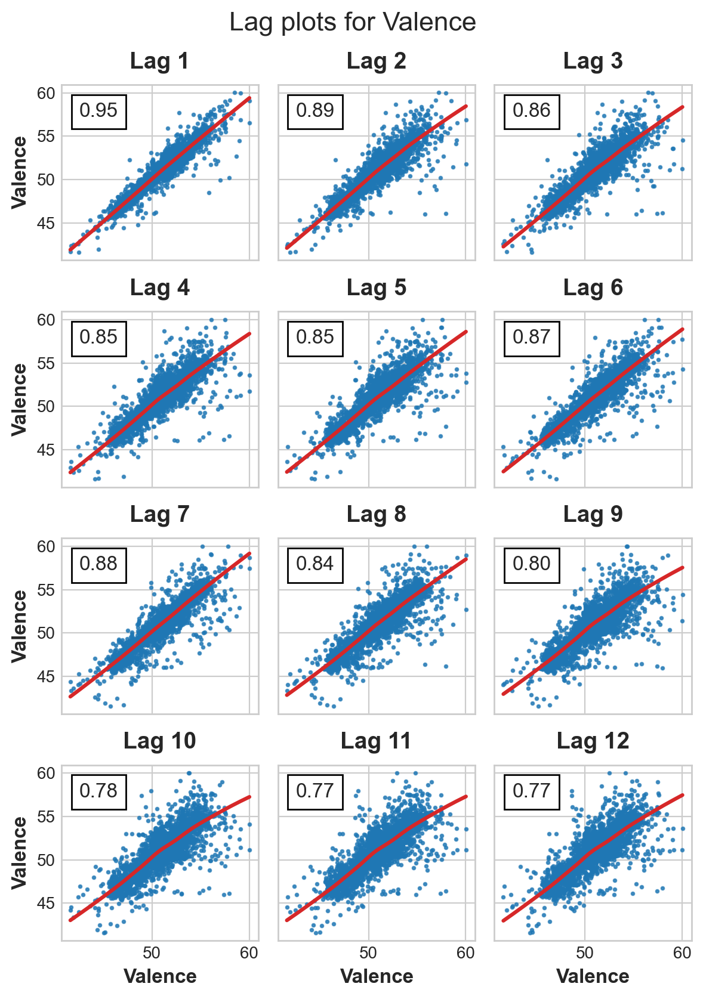

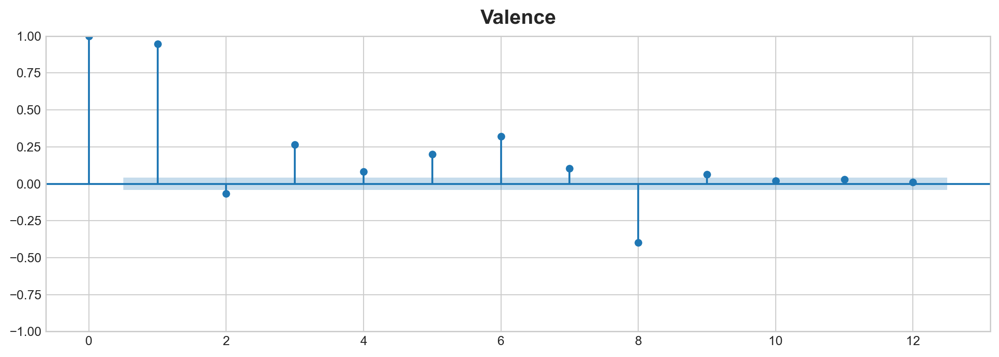

In [185]:
df_valence = df_features_daily_std["Valence"]
_ = plot_lags(df_valence, lags=12, nrows=4)
from statsmodels.graphics.tsaplots import plot_pacf
_ = plot_pacf(df_valence, lags=12, title="Valence")

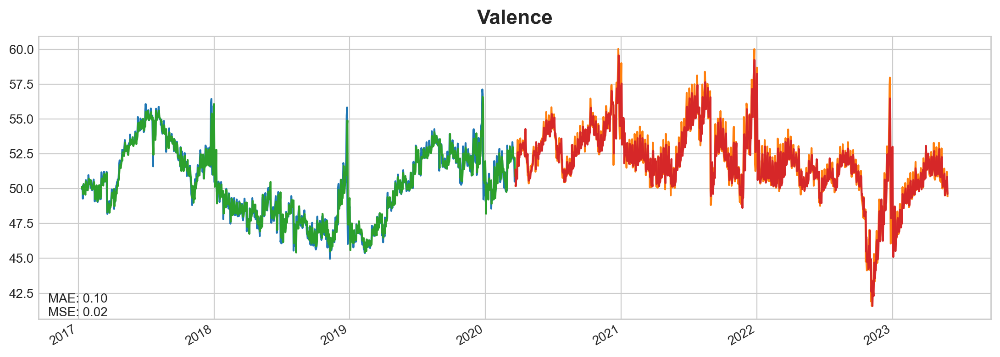

In [186]:
y_train, y_test, y_pred, y_fore = lag_LinReg(df_valence, lags=8, train_size=0.5)

ax = y_train.plot()
ax = y_test.plot()
ax = y_pred.plot(ax=ax)
_ = y_fore.plot(ax=ax, color='C3')
ax.annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.01, 0.01), xycoords='axes fraction')
ax.title.set_text("Valence")

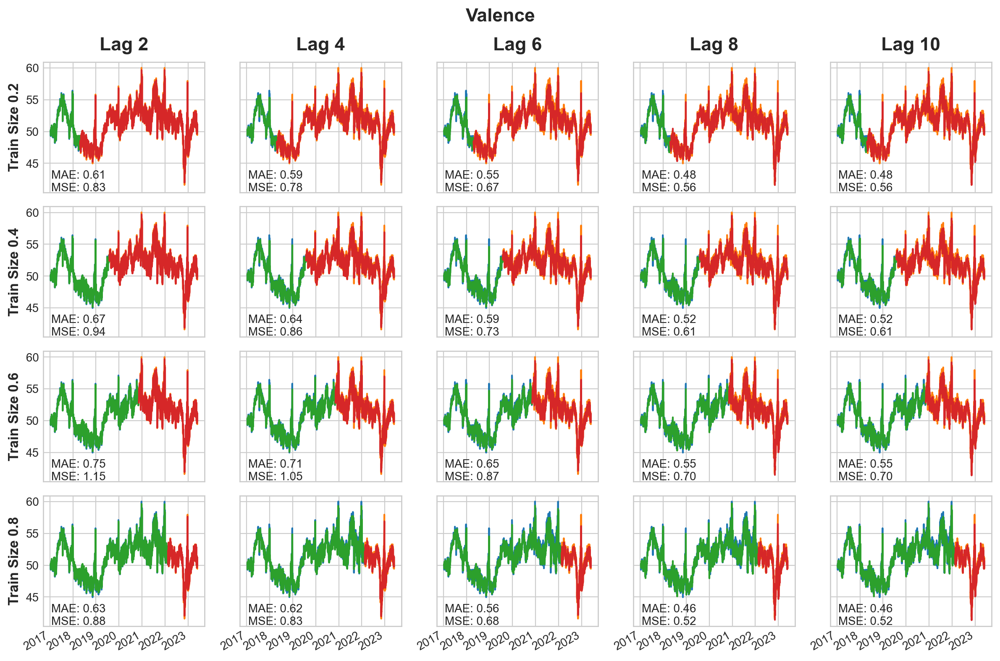

In [187]:
lags = range(2, 11, 2)
train_sizes = [0.2, 0.4, 0.6, 0.8]
fig, axs = plt.subplots(nrows=len(train_sizes), ncols=len(lags), figsize=(12, 8), sharex=True, sharey=True)
for i, train_size in enumerate(train_sizes):
    for j, lag in enumerate(lags):
        y_train, y_test, y_pred, y_fore = lag_LinReg(df_valence, lags=lag, train_size=train_size)
        MAE = mean_absolute_error(y_test, y_fore)
        MSE = mean_squared_error(y_test, y_fore)
        ax = y_train.plot(ax=axs[i, j], legend=False)
        ax = y_test.plot(ax=axs[i, j], legend=False)
        ax = y_pred.plot(ax=axs[i, j], legend=False)
        _ = y_fore.plot(ax=axs[i, j], legend=False, color='C3')
        axs[i, j].annotate(f"MAE: {MAE:.2f}\nMSE: {MSE:.2f}", xy=(0.05, 0.01), xycoords='axes fraction')
        if i == 0:
            axs[i, j].set_title(f"Lag {lag}")
        if j == 0:
            axs[i, j].set_ylabel(f"Train Size {train_size}")
fig.suptitle("Valence", fontsize=16, fontweight='bold')
fig.tight_layout()